### https://techvidvan.com/tutorials/gender-age-detection-ml-keras-opencv-cnn/

### We didn't make data augmentation cause the accuracy is getting worse

### https://stackoverflow.com/questions/4493554/neural-network-always-produces-same-similar-outputs-for-any-input 

### https://www.quora.com/Why-does-my-own-neural-network-give-me-the-same-output-for-different-input-sets

#### these is a link for the problem of having the same predictions for all the inputs

In [1]:
import numpy as np 
import plotly.express as px 
import pandas as pd 
import cv2 
import pydot
import graphviz
import os
import gc
import random
from glob import glob
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
from tensorflow.keras.models import Model,Sequential
import scipy.stats as stats
from tensorflow.keras.layers import Conv2D, MaxPool2D,MaxPooling2D,Activation, Dropout, Flatten, Dense, Dropout,AveragePooling2D,GlobalAveragePooling2D,LayerNormalization,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import matplotlib.pyplot as plt
from keras import backend as K
from keras.utils import np_utils
from keras.utils.vis_utils import plot_model
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pickle 

In [2]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')  
        plt.show()

In [3]:
data_parent = 'C:/Users/ayman/Desktop/nour/15_datascienceprojects/Projects_Intermediate/2_ Gender Detection and Age Prediction/AdienceBenchmarkGenderAndAgeClassification/'
print(os.listdir(data_parent))

['AdienceBenchmarkGenderAndAgeClassification', 'faces', 'fold_0_data.txt', 'fold_1_data.txt', 'fold_2_data.txt', 'fold_3_data.txt', 'fold_4_data.txt', '__MACOSX']


In [4]:
fold_0 = pd.read_csv(os.path.join(data_parent, 'fold_0_data.txt'),sep='\t')
fold_1 = pd.read_csv(os.path.join(data_parent, 'fold_1_data.txt'),sep='\t')
fold_2 = pd.read_csv(os.path.join(data_parent, 'fold_2_data.txt'),sep='\t')
fold_3 = pd.read_csv(os.path.join(data_parent, 'fold_3_data.txt'),sep='\t')
fold_4 = pd.read_csv(os.path.join(data_parent, 'fold_4_data.txt'),sep='\t')
total_data = pd.concat([fold_0, fold_1, fold_2, fold_3, fold_4], ignore_index=True)
total_data.head()

,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [5]:
fold_0

,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34
...,...,...,...,...,...,...,...,...,...,...,...,...
4479,68094148@N04,11373794746_4720ac792a_o.jpg,478,"(25, 32)",m,664,0,242,211,-5,-15,73
4480,68094148@N04,11355711315_0f5b5da125_o.jpg,477,"(25, 32)",f,915,51,109,112,0,45,14
4481,10693681@N00,9162730346_b1bf71120a_o.jpg,479,"(25, 32)",m,2145,1270,249,249,10,30,25
4482,113830953@N04,11855529986_dff116e018_o.jpg,480,None,NaN,2878,1300,306,306,-100,0,164


In [6]:
print('[+] length of the file:', len(total_data))
print('[+] unique values of Age:')
print(total_data.age.unique())
print('===================================================')
print('[+] Number of None Values in Age:')
print((total_data.age == 'None').sum())
print('[+] unique values of Gender:')
print(total_data.gender.unique())
print('===================================================')
print('[+] Number of nan values in Gender:')
print(total_data.gender.isna().sum())

[+] length of the file: 19370
[+] unique values of Age:
['(25, 32)' '(38, 43)' '(4, 6)' '(60, 100)' '(15, 20)' '(48, 53)'
 '(8, 12)' '(0, 2)' 'None' '(38, 48)' '35' '3' '55' '58' '22' '13' '45'
 '36' '23' '(38, 42)' '(8, 23)' '(27, 32)' '57' '56' '2' '29' '34' '42'
 '46' '32']
[+] Number of None Values in Age:
748
[+] unique values of Gender:
['f' 'm' nan 'u']
[+] Number of nan values in Gender:
779


In [7]:
df_gender=total_data.groupby('gender')['gender'].count().to_frame().rename(columns = {'gender':'count'})

In [8]:
df_gender.reset_index(inplace=True)

In [9]:
df_gender

,gender,count
0,f,9372
1,m,8120
2,u,1099


In [10]:
fig = px.pie(df_gender,values='count',names='gender',color="gender")
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text="Gender Chart", legend_title='Gender')
fig.show()

In [11]:
df_age=total_data.groupby('age')['age'].count().to_frame().rename(columns = {'age':'count'})

In [12]:
df_age.reset_index(inplace=True)

In [13]:
df_age

,age,count
0,"(0, 2)",2488
1,"(15, 20)",1642
2,"(25, 32)",5004
3,"(27, 32)",77
4,"(38, 42)",46
5,"(38, 43)",2293
6,"(38, 48)",6
7,"(4, 6)",2140
8,"(48, 53)",830
9,"(60, 100)",872


In [14]:
fig = px.pie(df_age,values='count',names='age',color="age")
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text="Age Chart", legend_title="Age")
fig.show()

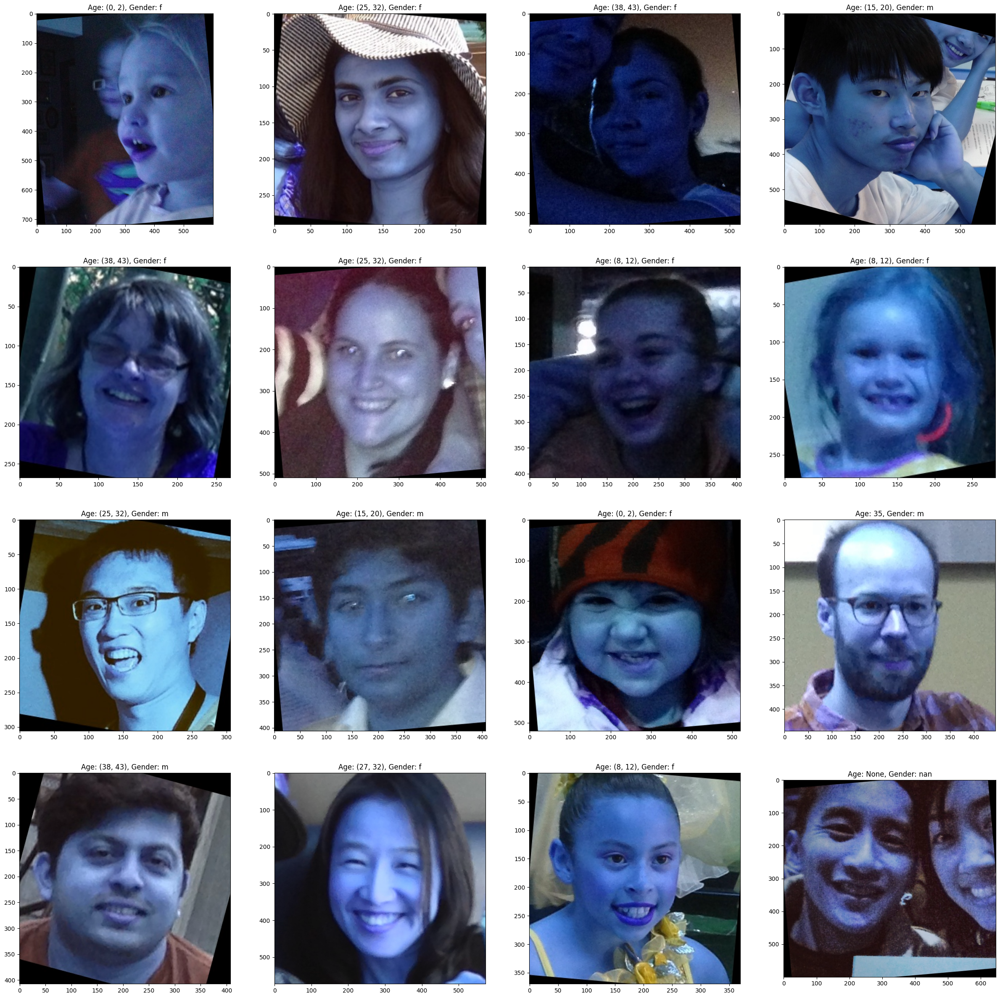

In [15]:
images = []
for i in range(16):
    sample_num = random.randint(0, len(total_data))
    path = data_parent+"/faces/"+total_data.user_id.loc[sample_num]+"/coarse_tilt_aligned_face."+str(total_data.face_id.loc[sample_num])+"."+total_data.original_image.loc[sample_num]
    img = load_img(path)
    age = total_data.iloc[sample_num].age
    gender = total_data.iloc[sample_num].gender
    n_col = 4
    n_rows = 4
    images.append((img, age, gender))
    
fig, axs = plt.subplots(ncols=n_col, nrows=n_rows, figsize=(30,30))
count = 0
for i in range(n_rows):
      for j in range(n_col):
            img = np.array(images[count][0], dtype="uint8")
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axs[i][j].imshow(gray)
            axs[i][j].set_title(f'Age: {images[count][1]}, Gender: {images[count][2]}')
            count+=1
plt.show()

In [16]:
#Mapping age label and drop irrelevant data
age_mapping = [('(0, 2)', '0-2'), ('2', '0-2'), ('3', '0-2'), ('(4, 6)', '4-6'), 
              ('(8, 12)', '8-13'), ('13', '8-13'), ('22', '15-20'), ('(8, 23)','15-20'),
              ('23', '25-32'), ('(15, 20)', '15-20'), ('(25, 32)', '25-32'), ('(27, 32)', '25-32'), 
              ('32', '25-32'), ('34', '25-32'), ('29', '25-32'), ('(38, 42)', '38-43'), ('35', '38-43'), 
              ('36', '38-43'), ('42', '48-53'), ('45', '38-43'), ('(38, 43)', '38-43'), ('(38, 42)', '38-43'), 
              ('(38, 48)', '48-53'), ('46', '48-53'), ('(48, 53)', '48-53'), ('55', '48-53'), ('56', '48-53'), 
              ('(60, 100)', '60+'), ('57', '60+'), ('58', '60+')]

age_mapping_dict = {each[0]: each[1] for each in age_mapping}

In [17]:
age_mapping_dict

{'(0, 2)': '0-2',
 '2': '0-2',
 '3': '0-2',
 '(4, 6)': '4-6',
 '(8, 12)': '8-13',
 '13': '8-13',
 '22': '15-20',
 '(8, 23)': '15-20',
 '23': '25-32',
 '(15, 20)': '15-20',
 '(25, 32)': '25-32',
 '(27, 32)': '25-32',
 '32': '25-32',
 '34': '25-32',
 '29': '25-32',
 '(38, 42)': '38-43',
 '35': '38-43',
 '36': '38-43',
 '42': '48-53',
 '45': '38-43',
 '(38, 43)': '38-43',
 '(38, 48)': '48-53',
 '46': '48-53',
 '(48, 53)': '48-53',
 '55': '48-53',
 '56': '48-53',
 '(60, 100)': '60+',
 '57': '60+',
 '58': '60+'}

In [18]:
#see what's the unique values in the age column
total_data['age'].unique()

array(['(25, 32)', '(38, 43)', '(4, 6)', '(60, 100)', '(15, 20)',
       '(48, 53)', '(8, 12)', '(0, 2)', 'None', '(38, 48)', '35', '3',
       '55', '58', '22', '13', '45', '36', '23', '(38, 42)', '(8, 23)',
       '(27, 32)', '57', '56', '2', '29', '34', '42', '46', '32'],
      dtype=object)

In [19]:
#replacing values of age with age_mapping dictionary 
total_data['age'].replace(age_mapping_dict,inplace=True)

In [20]:
#we will not take the None value in the age column
total_data = total_data[total_data.age != 'None'].copy()

In [21]:
#rejustify that the unique values of the age column are changed
total_data['age'].unique()

array(['25-32', '38-43', '4-6', '60+', '15-20', '48-53', '8-13', '0-2'],
      dtype=object)

In [22]:
#see what's the unique values in the gender column
total_data['gender'].unique()

array(['f', 'm', 'u', nan], dtype=object)

In [23]:
#take only the f and m gender
total_data = total_data[total_data.gender != 'u'].copy()

In [24]:
#justify that the unique values of the gender column are changed
total_data['gender'].unique()

array(['f', 'm', nan], dtype=object)

In [25]:
#Let's check if we have nan values
total_data.isna().sum()
#we have 779 values in the gender column

user_id                0
original_image         0
face_id                0
age                    0
gender                71
x                      0
y                      0
dx                     0
dy                     0
tilt_ang               0
fiducial_yaw_angle     0
fiducial_score         0
dtype: int64

In [26]:
#Let's drop the nan values
total_data.dropna(inplace=True)

In [27]:
#Let's check tyhe types of the columns
total_data.dtypes

user_id               object
original_image        object
face_id                int64
age                   object
gender                object
x                      int64
y                      int64
dx                     int64
dy                     int64
tilt_ang               int64
fiducial_yaw_angle     int64
fiducial_score         int64
dtype: object

In [28]:
#we need to drop the last 3 columns cauze there are irrelevants columns 
total_data.drop(columns=['tilt_ang','fiducial_yaw_angle','fiducial_score'],inplace=True)

In [29]:
total_data

,user_id,original_image,face_id,age,gender,x,y,dx,dy
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,25-32,f,0,414,1086,1383
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,25-32,m,301,105,640,641
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,25-32,f,2395,876,771,771
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,25-32,m,752,1255,484,485
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,25-32,m,175,80,769,768
...,...,...,...,...,...,...,...,...,...
19341,101515718@N03,10587826073_6663f5b654_o.jpg,2280,25-32,f,718,748,492,492
19342,101515718@N03,10587571495_a61785cd06_o.jpg,2278,25-32,m,48,472,768,768
19343,101515718@N03,10587571495_a61785cd06_o.jpg,2279,25-32,f,950,0,692,687
19344,50458575@N08,9426695459_9e8b347604_o.jpg,2281,25-32,f,831,895,899,899


In [30]:

#labeling gender
gender_to_label_map = {
    'f' : 0,
    'm' : 1
}

#labeling age
age_to_label_map = {
    '0-2'  :0,
    '4-6'  :1,
    '8-13' :2,
    '15-20':3,
    '25-32':4,
    '38-43':5,
    '48-53':6,
    '60+'  :7
}

label_to_age_map = {value: key for key, value in age_to_label_map.items()}
label_to_gender_map = {value: key for key, value in gender_to_label_map.items()}

In [31]:
#change age and gender to labels
total_data['age'] = total_data['age'].apply(lambda age: age_to_label_map[age])
total_data['gender'] = total_data['gender'].apply(lambda g: gender_to_label_map[g])

total_data.head()

,user_id,original_image,face_id,age,gender,x,y,dx,dy
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,4,0,0,414,1086,1383
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,4,1,301,105,640,641
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,4,0,2395,876,771,771
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,4,1,752,1255,484,485
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,4,1,175,80,769,768


In [32]:
#Check the unique values in the age and gender columns
print('Unique values in the gender column :{}'.format(total_data['gender'].unique()))
print('Unique values in the age column :{}'.format(total_data['age'].unique()))

Unique values in the gender column :[0 1]
Unique values in the age column :[4 5 1 7 3 6 2 0]


In [33]:
 # Iterate through each row and take the path file for it 
paths=[]

for index, row in total_data.iterrows():
    
    path = data_parent+"/faces/"+row['user_id']+"/coarse_tilt_aligned_face."+str(row['face_id'])+"."+row['original_image'] 
    paths.append(path)
    
#Add the paths as a column in the dataset
total_data['img_path']=paths
  

In [34]:
total_data

,user_id,original_image,face_id,age,gender,x,y,dx,dy,img_path
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,4,0,0,414,1086,1383,C:/Users/ayman/Desktop/nour/15_datascienceproj...
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,4,1,301,105,640,641,C:/Users/ayman/Desktop/nour/15_datascienceproj...
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,4,0,2395,876,771,771,C:/Users/ayman/Desktop/nour/15_datascienceproj...
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,4,1,752,1255,484,485,C:/Users/ayman/Desktop/nour/15_datascienceproj...
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,4,1,175,80,769,768,C:/Users/ayman/Desktop/nour/15_datascienceproj...
...,...,...,...,...,...,...,...,...,...,...
19341,101515718@N03,10587826073_6663f5b654_o.jpg,2280,4,0,718,748,492,492,C:/Users/ayman/Desktop/nour/15_datascienceproj...
19342,101515718@N03,10587571495_a61785cd06_o.jpg,2278,4,1,48,472,768,768,C:/Users/ayman/Desktop/nour/15_datascienceproj...
19343,101515718@N03,10587571495_a61785cd06_o.jpg,2279,4,0,950,0,692,687,C:/Users/ayman/Desktop/nour/15_datascienceproj...
19344,50458575@N08,9426695459_9e8b347604_o.jpg,2281,4,0,831,895,899,899,C:/Users/ayman/Desktop/nour/15_datascienceproj...


In [35]:
#shuffle the data 
# shuffle the main data 
shuffled = total_data.sample(frac=1)

In [36]:
shuffled

,user_id,original_image,face_id,age,gender,x,y,dx,dy,img_path
762,20254529@N04,8645701679_8869241ff1_o.jpg,21,4,1,612,250,1058,1058,C:/Users/ayman/Desktop/nour/15_datascienceproj...
10512,63164355@N03,11014305184_25bc533930_o.jpg,1111,5,1,322,488,204,205,C:/Users/ayman/Desktop/nour/15_datascienceproj...
4204,10354155@N05,11938342046_1df1117e6f_o.jpg,427,4,1,2789,473,369,370,C:/Users/ayman/Desktop/nour/15_datascienceproj...
10228,113525713@N07,11784555666_8d43b6c493_o.jpg,1042,3,1,25,693,319,319,C:/Users/ayman/Desktop/nour/15_datascienceproj...
4936,114841417@N06,12080467203_cbfb52e09c_o.jpg,493,3,1,1392,242,797,797,C:/Users/ayman/Desktop/nour/15_datascienceproj...
...,...,...,...,...,...,...,...,...,...,...
9666,9965452@N08,11242601515_3a6664813e_o.jpg,980,1,1,1286,761,586,587,C:/Users/ayman/Desktop/nour/15_datascienceproj...
10251,113525713@N07,11784469696_63969f59d6_o.jpg,1046,3,1,1520,925,484,485,C:/Users/ayman/Desktop/nour/15_datascienceproj...
2105,10044155@N06,11345804833_df3fc70d54_o.jpg,145,5,1,1421,970,242,242,C:/Users/ayman/Desktop/nour/15_datascienceproj...
10375,63164355@N03,8816070423_d99bb19f45_o.jpg,1072,4,0,1658,414,292,292,C:/Users/ayman/Desktop/nour/15_datascienceproj...


In [37]:
#splitting dataset
X = shuffled[['img_path']]
y = shuffled[['gender']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print('Train data shape {}'.format(X_train.shape))
print('Test data shape {}'.format(X_test.shape))

Train data shape (12216, 1)
Test data shape (5236, 1)


In [38]:
train_images = []
test_images = []

for row in X_train.iterrows():
    image = Image.open(row[1].img_path)
    image = image.resize((227,227))   # Resize the image
    data = np.asarray(image)
    train_images.append(data)

for row in X_test.iterrows():
    image = Image.open(row[1].img_path)
    image = image.resize((227,227))  # Resize the image
    data = np.asarray(image)
    test_images.append(data)

train_images = np.asarray(train_images)
test_images = np.asarray(test_images)

print('Train images shape {}'.format(train_images.shape))
print('Test images shape {}'.format(test_images.shape))


Train images shape (12216, 227, 227, 3)
Test images shape (5236, 227, 227, 3)


In [39]:
model = Sequential()
model.add(Conv2D(input_shape=(227, 227, 3), filters=96, kernel_size=(7, 7), strides=4, padding='valid', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Conv2D(filters=256, kernel_size=(5, 5), strides=1, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Flatten())
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(units=2, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 56, 56, 96)        14208     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 28, 28, 96)       0         
 )                                                               
                                                                 
 layer_normalization (LayerN  (None, 28, 28, 96)       192       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 256)      0         
 2D)                                                             
                                                        

In [40]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3) # Callback for earlystopping
model.compile(optimizer=tf.keras.optimizers.Adam(0.000015), loss=tf.keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
history = model.fit(train_images, y_train, batch_size=32, epochs=50, validation_data=(test_images, y_test), callbacks=[callback])

Epoch 1/50
382/382 [==============================] - 25s 38ms/step - loss: 0.7086 - accuracy: 0.5666 - val_loss: 0.6760 - val_accuracy: 0.5474
Epoch 2/50
382/382 [==============================] - 13s 35ms/step - loss: 0.6279 - accuracy: 0.6519 - val_loss: 0.5790 - val_accuracy: 0.6973
Epoch 3/50
382/382 [==============================] - 13s 35ms/step - loss: 0.5668 - accuracy: 0.7023 - val_loss: 0.5344 - val_accuracy: 0.7227
Epoch 4/50
382/382 [==============================] - 13s 35ms/step - loss: 0.5172 - accuracy: 0.7368 - val_loss: 0.4876 - val_accuracy: 0.7641
Epoch 5/50
382/382 [==============================] - 13s 35ms/step - loss: 0.4591 - accuracy: 0.7791 - val_loss: 0.4432 - val_accuracy: 0.7865
Epoch 6/50
382/382 [==============================] - 13s 35ms/step - loss: 0.3989 - accuracy: 0.8181 - val_loss: 0.4025 - val_accuracy: 0.8172
Epoch 7/50
382/382 [==============================] - 13s 35ms/step - loss: 0.3450 - accuracy: 0.8484 - val_loss: 0.3919 - val_accuracy:

In [43]:
model.save('gender_model25.h5')

In [44]:
test_loss, test_acc = model.evaluate(test_images,y_test,verbose=1)
print('Testing accuracy',test_acc)

164/164 [==============================] - 2s 12ms/step - loss: 0.5252 - accuracy: 0.8671
Testing accuracy 0.8670741319656372


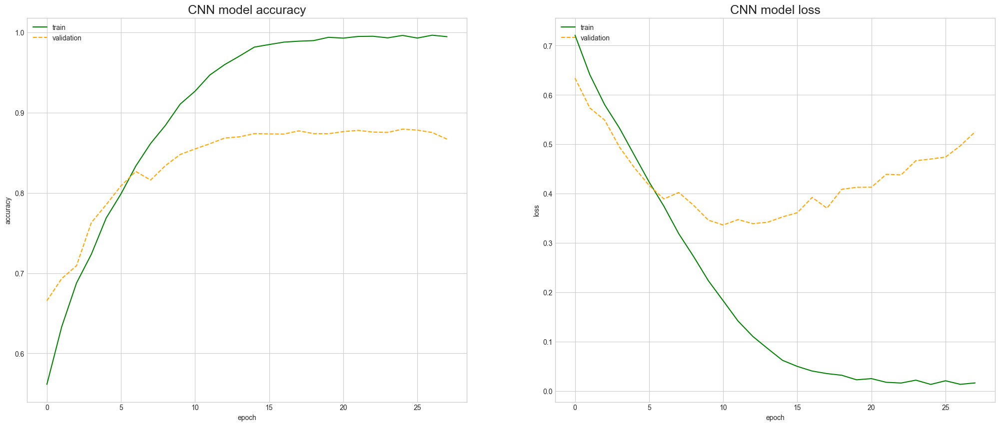

In [45]:
plot_history_scores(
    dict_history = history, 
    first_score = "accuracy", 
    second_score = "loss")

In [46]:
#predection
model.predict(test_images[:4])
#test_images[:4]
y_test[:4]

1/1 [==============================] - 1s 565ms/step


,gender
19252,0
3174,0
3741,1
5818,0


In [47]:
pred = model.predict(test_images)
pred = np.argmax(pred,axis = 1) 
y_true = np.argmax(y_test,axis = 1)

164/164 [==============================] - 2s 11ms/step


In [48]:
CM=classification_report(y_true, pred)
print(CM)

              precision    recall  f1-score   support

           0       1.00      0.50      0.66      5236
           1       0.00      0.00      0.00         0

    accuracy                           0.50      5236
   macro avg       0.50      0.25      0.33      5236
weighted avg       1.00      0.50      0.66      5236



C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [49]:
del history
del model
K.clear_session()
gc.collect()

9625

In [50]:
X = shuffled[['img_path']]
y = shuffled[['age']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [51]:
train_images = []
test_images = []

for row in X_train.iterrows():
    image = Image.open(row[1].img_path)
    image = image.resize((227,227))
    image=np.asarray(image)
    norm = np.zeros((800,800))
    image_norm = cv2.normalize(image, norm, 0, 255, cv2.NORM_MINMAX)
    data = np.asarray(image_norm)
    train_images.append(data)

for row in X_test.iterrows():
    image = Image.open(row[1].img_path)
    image = image.resize((227,227))  # Resize the image
    image= np.asarray(image)
    norm = np.zeros((800,800))
    image_norm = cv2.normalize(image, norm, 0, 255, cv2.NORM_MINMAX)
    #image_norm = cv2.normalize(image, None, alpha=0,beta=255, norm_type=cv2.NORM_MINMAX)
    data = np.asarray(image_norm)
    test_images.append(data)

train_images = np.asarray(train_images)
test_images = np.asarray(test_images)

print('Train images shape {}'.format(train_images.shape))
print('Test images shape {}'.format(test_images.shape))


Train images shape (12216, 227, 227, 3)
Test images shape (5236, 227, 227, 3)


In [52]:
model = Sequential()
model.add(Conv2D(input_shape=(227, 227, 3), filters=96, kernel_size=(7, 7),strides=4, kernel_regularizer=tf.keras.regularizers.l2(0.001), padding='valid', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Conv2D(filters=256, kernel_size=(5, 5), strides=1, kernel_regularizer=tf.keras.regularizers.l2(0.001),padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Conv2D(filters=256, kernel_size=(3, 3),strides=1,kernel_regularizer=tf.keras.regularizers.l2(0.001), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(LayerNormalization())
model.add(Flatten())
model.add(Dense(units=512,activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(units=512, activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(units=8, activation='softmax'))

In [53]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3) # Callback for earlystopping
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.000015), loss=tf.keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [54]:
history = model.fit(train_images, y_train, batch_size=32, epochs=50, validation_data=(test_images, y_test), callbacks=[callback])

Epoch 1/50
382/382 [==============================] - 15s 36ms/step - loss: 2.3774 - accuracy: 0.2707 - val_loss: 2.2776 - val_accuracy: 0.2983
Epoch 2/50
382/382 [==============================] - 13s 34ms/step - loss: 2.2895 - accuracy: 0.2976 - val_loss: 2.2220 - val_accuracy: 0.3254
Epoch 3/50
382/382 [==============================] - 13s 35ms/step - loss: 2.2234 - accuracy: 0.3184 - val_loss: 2.1502 - val_accuracy: 0.3455
Epoch 4/50
382/382 [==============================] - 13s 35ms/step - loss: 2.1510 - accuracy: 0.3441 - val_loss: 2.0821 - val_accuracy: 0.3663
Epoch 5/50
382/382 [==============================] - 13s 35ms/step - loss: 2.0740 - accuracy: 0.3633 - val_loss: 2.0193 - val_accuracy: 0.3930
Epoch 6/50
382/382 [==============================] - 13s 35ms/step - loss: 1.9909 - accuracy: 0.3933 - val_loss: 1.9572 - val_accuracy: 0.4095
Epoch 7/50
382/382 [==============================] - 13s 35ms/step - loss: 1.9178 - accuracy: 0.4241 - val_loss: 1.8804 - val_accuracy:

In [56]:
model.save('age_model50.h5')

In [55]:
test_loss, test_acc = model.evaluate(test_images,y_test, verbose=1)
print('Testing accuracy',test_acc)

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

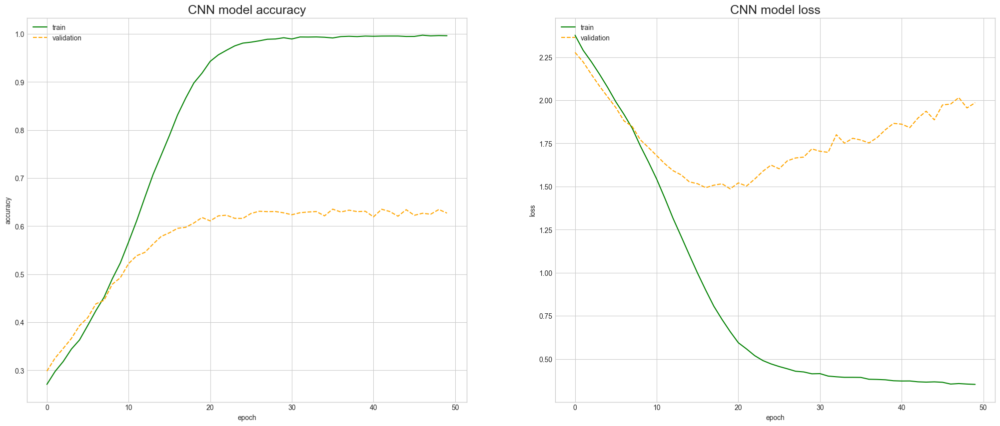

In [57]:
plot_history_scores(
    dict_history = history, 
    first_score = "accuracy", 
    second_score = "loss")

In [58]:
del history
del model
K.clear_session()
gc.collect()

11831

In [59]:
#predection
model.predict(test_images[:4])
#test_images[:4]
y_test[:4]

NameError: name 'model' is not defined

In [46]:
pred2 = model.predict(test_images)
pred2 = np.argmax(pred2,axis = 1) 
y_true2 = np.argmax(y_test,axis = 1)

164/164 [==============================] - 2s 11ms/step


In [47]:
CM2=classification_report(y_true2, pred2)

C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\ayman\anaconda3\envs\GPUenv\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [49]:
print(CM2)

              precision    recall  f1-score   support

           0       1.00      0.08      0.14      5236
           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0

    accuracy                           0.08      5236
   macro avg       0.12      0.01      0.02      5236
weighted avg       1.00      0.08      0.14      5236



In [60]:
model_age = load_model('age_model50.h5')
model_gender=load_model('gender_model25.h5')

In [61]:
#to plot image
def show_image(file_name, age, gender):
    image = Image.open(file_name)
    plt.imshow(image)
    plt.title(f'size (w, h): {image.size}, age: {age}, gender: {gender}')
    plt.show()
    

1/1 [==============================] - 0s 19ms/step
[[0.00730519 0.99269485]]
[1]
1/1 [==============================] - 0s 19ms/step


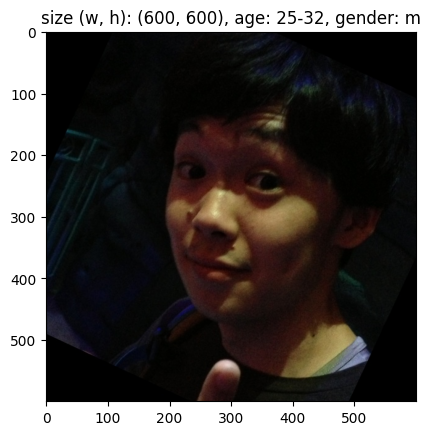

In [70]:
#Plot random image with its size, predicted gender and predicted age

idx = np.random.randint(shuffled.shape[0])
fname = shuffled['img_path'].iloc[idx]
image = Image.open(fname)
image=np.asarray(image)
image=cv2.resize(image,(227,227))
image= np.expand_dims(image,axis=0)

pred_gender = model_gender.predict(image)
print(pred_gender)
pred_gender= np.argmax(pred_gender,axis = 1)
print(pred_gender)

pred_age= model_age.predict(image)
pred_age = np.argmax(pred_age,axis = 1) 

age = label_to_age_map[pred_age[0]]
gender = label_to_gender_map[pred_gender[0]]
show_image(fname, age, gender)